## Initialising data

In [95]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import geopy

from geopy.distance import geodesic
from scipy.spatial import distance




# File with housing data in California
housing = pd.read_csv('housing.csv')

# I created a CSV file containing the coordinates of California's coastal border using QGIS.
ca_border = pd.read_csv('ca_coordinates.csv', sep=';')

## Basic information about the data

In [12]:
housing.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


In [13]:
housing.tail()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
20635,-121.09,39.48,25.0,1665.0,374.0,845.0,330.0,1.5603,78100.0,INLAND
20636,-121.21,39.49,18.0,697.0,150.0,356.0,114.0,2.5568,77100.0,INLAND
20637,-121.22,39.43,17.0,2254.0,485.0,1007.0,433.0,1.7000,92300.0,INLAND
20638,-121.32,39.43,18.0,1860.0,409.0,741.0,349.0,1.8672,84700.0,INLAND
20639,-121.24,39.37,16.0,2785.0,616.0,1387.0,530.0,2.3886,89400.0,INLAND


In [14]:
housing.describe()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000
max,-114.310000,41.950000,52.000000,39320.000000,6445.000000,35682.000000,6082.000000,15.000100,500001.000000


In [15]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


In [16]:
# How many different categories are there in column ocean_proximity and how many entries for each category?
housing['ocean_proximity'].value_counts()

ocean_proximity
<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: count, dtype: int64

The dataset consists of 20,640 entries, each representing housing data from California. Given that the columns **total_rooms** and **population** contain very large values, it is reasonable to assume that the entries do not represent single houses but rather entire building blocks. For example, 50% of the entries have more than 2,000 rooms. However, the smallest entries appear to correspond to single houses. For convenience, I will refer to an entry as a "building block" from now on.

The dataset contains 10 columns:

 - **Longitude** and **latitude**: Provide the geographical coordinates of each block.
 - **Housing_median_age**: The median age (in years) of the houses in the block. This value might be capped, as the largest value is 52. More about this later.
 - **Total_rooms** and **total_bedrooms**: Represent the total number of rooms and bedrooms in the block. More details on this later.
 - **Population** and **households**: Indicate the total population and number of households in each block. These columns will also be discussed further.
 - **Median_income**: The median income of the block's population, measured in tens of thousands of dollars. This value might also be capped, as the highest value is 15.0001.
 - **Median_house_value**: The median house value in the block. This column appears to be capped, as the largest value is 500,001.
 - **Ocean_proximity**: The only non-numerical column, representing five distinct geographical categories: NEAR OCEAN, <1H OCEAN, INLAND, NEAR BAY, and ISLAND.

## The numbers in more detail

Let’s perform some checks to identify any obvious errors or unrealistic values in the housing dataset.

#### Null values

There are 207 entries (1.0%) with null values in the **total_bedrooms** column, as noted earlier. These entries are evenly distributed across the state of California, as shown below. I have chosen not to drop these entries, as they are unlikely to have a significant impact on the analysis.

In [22]:
missing_data_by_proximity = housing[housing['total_bedrooms'].isna()].groupby('ocean_proximity').size()
total_by_proximity = housing.groupby('ocean_proximity').size()

missing_percentage = (missing_data_by_proximity / total_by_proximity) * 100

print(missing_data_by_proximity)
print(missing_percentage)

ocean_proximity
<1H OCEAN     102
INLAND         55
NEAR BAY       20
NEAR OCEAN     30
dtype: int64
ocean_proximity
<1H OCEAN     1.116462
INLAND        0.839566
ISLAND             NaN
NEAR BAY      0.873362
NEAR OCEAN    1.128668
dtype: float64


#### Number of rooms

In [24]:
invalid_rows = housing[housing['total_bedrooms'] > housing['total_rooms']]

if len(invalid_rows) > 0:
    print(invalid_rows)
else:
    print('There is no case where # of bedrooms > than # total rooms')


There is no case where # of bedrooms > than # total rooms


Here, I want to ensure there is no obviously invalid data regarding the number of bedrooms. It’s logically impossible for there to be more bedrooms than total rooms.

#### Distribution of people in the building blocks

In [27]:
housing_household_data = housing.copy()

housing_household_data['population_per_household'] = housing['population'] / housing['households']
housing_household_data['rooms_per_household'] = housing['total_rooms'] / housing['households']
housing_household_data[['population_per_household', 'rooms_per_household']].describe()

,population_per_household,rooms_per_household
count,20640.000000,20640.000000
mean,3.070655,5.429000
std,10.386050,2.474173
min,0.692308,0.846154
25%,2.429741,4.440716
50%,2.818116,5.229129
75%,3.282261,6.052381
max,1243.333333,141.909091


In [28]:
print('Number of households with less than 1 person:', housing_household_data[housing_household_data['population_per_household'] < 1].shape[0])
print('Number of households with less than 1 room:', housing_household_data[housing_household_data['rooms_per_household'] < 1].shape[0])
print()
print('Number of households with more than 20 people:', housing_household_data[housing_household_data['population_per_household'] > 20].shape[0])
print('Number of households with more than 50 rooms:', housing_household_data[housing_household_data['rooms_per_household'] > 50].shape[0])

Number of households with less than 1 person: 3
Number of households with less than 1 room: 2

Number of households with more than 20 people: 10
Number of households with more than 50 rooms: 9


There are entries where the total number of rooms is less than the number of households, which seems to be an error. Additionally, some entries have fewer than one room per household, indicating another anomaly. However, these issues are minimal, with only three and two occurrences respectively, so they are unlikely to significantly impact the analysis.

There are also entries with abnormally high values for population per household and rooms per household. For example:
10 households with more than 20 people per household.
9 households with more than 50 rooms per household.
While these are unusual cases, they are minimal and unlikely to significantly impact the overall analysis. However, it may still be worthwhile to evaluate these anomalies further if the results are highly sensitive to extreme values.

#### Does it reflect the population of California?

In [31]:
print('Entire population in the dataset: ', housing['population'].sum())

Entire population in the dataset:  29421840.0


The sum of population across all entries is about 29 million. There are about 39 million living in California today. However, the data set seems to be from 1990 and by that time California had a population of around 29 million. This suggests it might reflect a comprehensive snapshot of properties from that time.

In [33]:
print('Average number of people per household:', housing['population'].sum() / housing['households'].sum())

Average number of people per household: 2.853580607495331


The average number of people per household seems reasonable, as the current average household size in California is 2.9 people.

In [35]:
print('Median income of the entire dataset: ', housing['median_income'].median())

Median income of the entire dataset:  3.5347999999999997


In [36]:
housing[housing['median_income'] > 12].groupby('median_income').size()

median_income
12.0088     1
12.0372     1
12.0933     1
12.1387     1
12.1579     1
           ..
14.4219     1
14.5833     1
14.9009     1
15.0000     2
15.0001    49
Length: 64, dtype: int64

The median income aligns with what I have found for California in 1990, though it's worth noting that the median of medians may not be perfectly accurate but is sufficiently close. When examining the blocks with the highest median income, I found that 49 blocks have a median income of exactly 150 000.1 USD, suggesting that the data may be capped at the upper end. However, it will not affect the median in any way.

In [38]:
housing[housing['median_house_value'] > 490000].groupby('median_house_value').size()

median_house_value
490300.0      1
490400.0      1
490800.0      2
491200.0      2
492000.0      1
492200.0      1
492300.0      1
492500.0      2
492900.0      1
493000.0      1
493200.0      1
493300.0      1
493400.0      1
493800.0      1
494000.0      1
494400.0      1
494700.0      1
495400.0      1
495500.0      3
495600.0      2
495800.0      1
495900.0      1
496000.0      1
496400.0      2
497400.0      1
497600.0      1
498400.0      1
498600.0      1
498700.0      1
498800.0      1
499000.0      1
499100.0      1
500000.0     27
500001.0    965
dtype: int64

I haven’t found any historical data on housing prices in California, but when examining the data at the upper end, it’s clear that it has been capped at 500 001 USD. There are 965 building blocks with the exact same value at the highest point. This could have a significant negative impact on data analysis that involves housing prices.

In [40]:
housing.groupby('ocean_proximity')['population'].sum()

ocean_proximity
<1H OCEAN     13889374.0
INLAND         9112744.0
ISLAND            3340.0
NEAR BAY       2817427.0
NEAR OCEAN     3598955.0
Name: population, dtype: float64

Most people in the dataset live near the ocean, while just under one-third reside in inland areas. Although I don’t have additional data to verify these numbers, they seem reasonable since California's largest cities are located along the coast.

## Distributions of numercial data with histograms

Let’s plot the data in histograms to gain a visual understanding of the dataset. We will exclude longitude and latitude for now, as I will present a plot with those later.

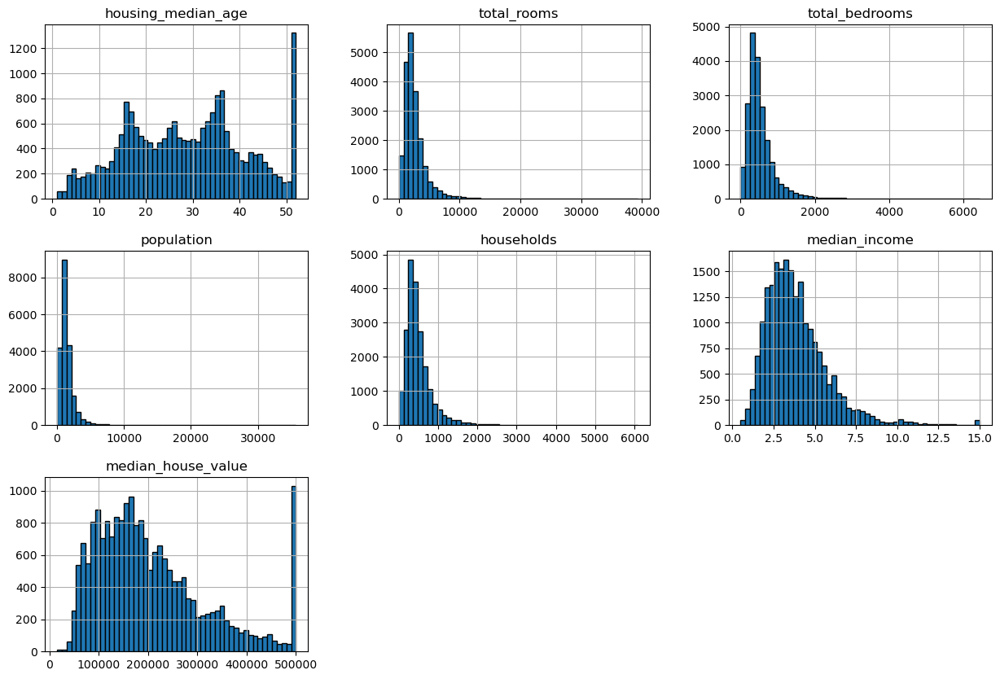

In [44]:
numerical_data = housing.select_dtypes(include='number').drop(['longitude', 'latitude'], axis=1)
numerical_data.hist(bins=50, figsize=(15, 10), edgecolor='black')
plt.show()

The **housing_median_age** histogram clearly indicates that the data is capped at the upper end, with a significant number of blocks having a median building age of 52 years or older. However, it is not possible to determine how much older these blocks might be. The same observation applies to **median_house_value**, where the data is also capped.

Although less evident in **median_income**, a slight indication of capping can be observed, as the rightmost bar is slightly higher than expected.

For **total_rooms**, **total_bedrooms**, **population**, and **households**, the data is largely clustered, but there are noticeable outliers extending far to the right. 

#### Outliers

Let’s take a closer look at the outliers in more detail.

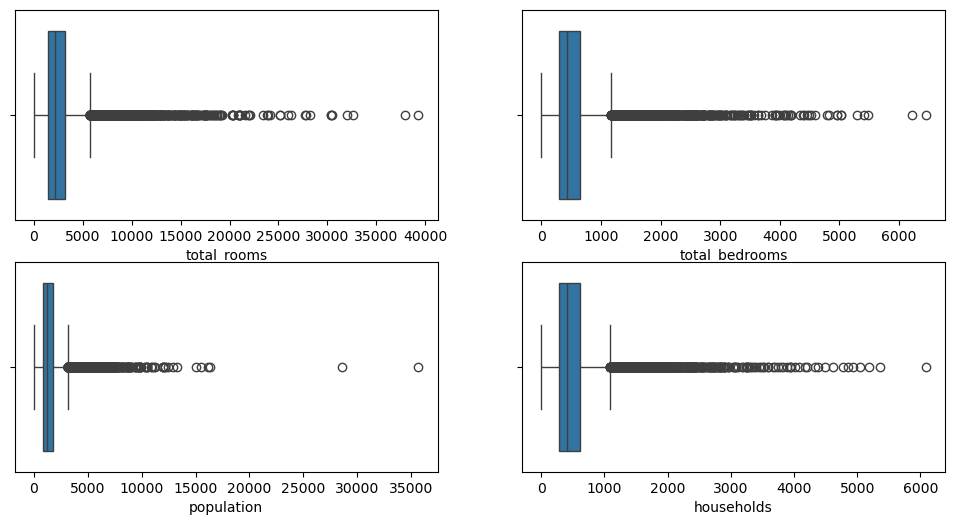

total_rooms: 0 left outliers, 1287 right outliers
total_bedrooms: 0 left outliers, 1271 right outliers
population: 0 left outliers, 1196 right outliers
households: 0 left outliers, 1220 right outliers


In [48]:
features = ['total_rooms', 'total_bedrooms', 'population', 'households']

plt.figure(figsize=(12, 6))

for i, feature in enumerate(features, 1):
    plt.subplot(2, 2, i)
    sns.boxplot(x=housing[feature])
    plt.xlabel(feature)

plt.show()

# Calculate number of outliers for each feature using the IQR method
outlier_counts_left = {}
outlier_counts_right = {}

for i in features:
    Q1 = housing[i].quantile(0.25)  # 25th percentile
    Q3 = housing[i].quantile(0.75)  # 75th percentile, 
    IQR = Q3 - Q1  # Interquartile range
    lower_bound = Q1 - 1.5 * IQR  # Lower fence
    upper_bound = Q3 + 1.5 * IQR  # Upper fence

    # Count outliers to the left (below lower bound)
    left_outliers = housing[housing[i] < lower_bound]
    outlier_counts_left[i] = len(left_outliers)

    # Count outliers to the right (above upper bound)
    right_outliers = housing[housing[i] > upper_bound]
    outlier_counts_right[i] = len(right_outliers)

for i in features:
    print(f"{i}: {outlier_counts_left[i]} left outliers, {outlier_counts_right[i]} right outliers")

The proportion of outliers (over 5% according to the IQR method) and the fact that they are all on the right side suggest that these features may have long tails or skewed distributions rather than being strictly normally distributed. This is typical for real-world datasets like **total_rooms** and **population**, where extreme values (e.g., large apartment complexes or densely populated areas) are expected.

However, there may also be errors in the data. As shown in the box plots above, some extreme outliers stand out and warrant further investigation.

## The geographical distribuition of all bulding blocks.

In [51]:
# I group the data by ocean_proximity and give each category a unique color. 
colors = {'<1H OCEAN': 'cyan', 'INLAND': 'green', 'ISLAND': 'red', 'NEAR BAY': 'yellow', 'NEAR OCEAN': 'blue'}
housing['color'] = housing['ocean_proximity'].map(colors)

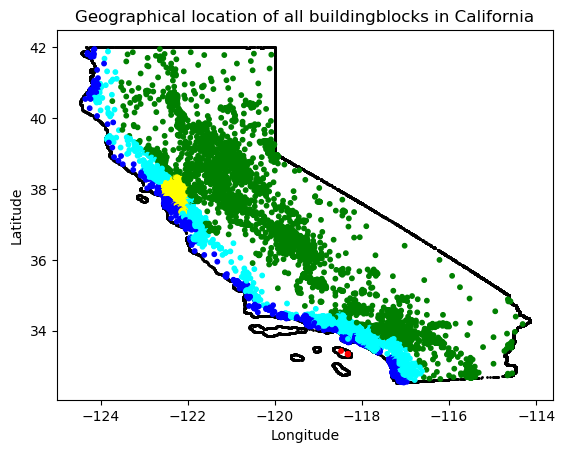

In [52]:
fig, ax = plt.subplots()
ax.scatter(ca_border['xcoord'], ca_border['ycoord'], label='Border', color='black', s=1)
ax.scatter(housing['longitude'], housing['latitude'], label='Houses', color=housing['color'], s=10)
ax.set_title('Geographical location of all buildingblocks in California')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

As shown in the plot above, each building block appears to have the correct coordinates, with none falling outside the state border. The categories align with the map:
 - The left side of the border, where the ocean is, shows the **blue points (NEAR OCEAN)**, which are closest to the ocean.
 - The **cyan-colored points (<1H OCEAN)** are located a bit further inland.
 - The **green points (INLAND)** represent areas farther from the coast.
 - The **yellow points (NEAR BAY)** are clustered around San Francisco.
 - Finally, the few **red points (ISLAND)** are located on an island off the coast of Los Angeles.

## Correlations

Let’s calculate the correlations between numerical data to identify any significant relationships.

In [56]:
housing_numeric = housing.select_dtypes(include=['number'])

# Calculate the correlation of all numerical features with 'housing_median_value'
correlations = housing_numeric.corr()['median_house_value'].sort_values(ascending=False)

print(correlations)

median_house_value    1.000000
median_income         0.688075
total_rooms           0.134153
housing_median_age    0.105623
households            0.065843
total_bedrooms        0.049686
population           -0.024650
longitude            -0.045967
latitude             -0.144160
Name: median_house_value, dtype: float64


There is a correlation between **median_house_value** and **median_income**. Let’s plot this relationship.

#### Scatterplot - Median House Value as a dependency on Median Income

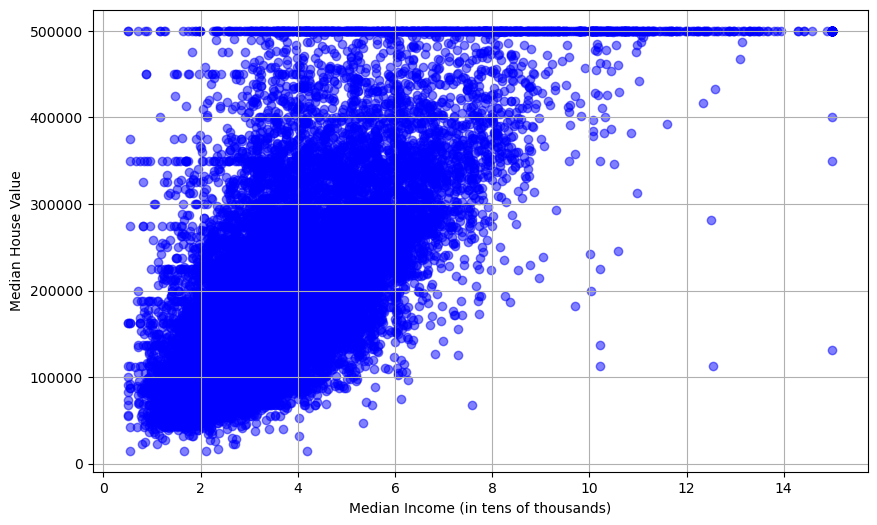

In [59]:
plt.figure(figsize=(10, 6))
plt.scatter(housing['median_income'], housing['median_house_value'], alpha=0.5, c='blue')
plt.xlabel('Median Income (in tens of thousands)')
plt.ylabel('Median House Value')
plt.grid(True)
plt.show()

In the plot above, we can observe the correlation between income and house value. The capping of house values is clearly visible at the top of the plot. Capping can be useful in some cases, particularly when there are a few values significantly higher than the rest. However, it's generally better to retain the original data and perform the data cleaning manually. In this case, there are quite a number of data points that have been capped. Let’s examine them in more detail.

In [61]:
capped_house_values = housing[housing['median_house_value'] >= 500001]

grouped_counts = capped_house_values.groupby('ocean_proximity').size()
total_counts = housing.groupby('ocean_proximity').size()

ratio = grouped_counts / total_counts

print('Number of entries with capped house value: ', capped_house_values.shape[0])
print()
print('---Number of capped house values grouped by ocean proximity---')
print(grouped_counts)
print('---The ratio of capped house values by ocean proximity---')
print(ratio)
print()

grouped_counts = capped_house_values.groupby(np.floor(housing['median_income'])).size()
total_counts = housing.groupby(np.floor(housing['median_income'])).size()
ratio = grouped_counts / total_counts
print('---Number of capped house values grouped by income---')
print(grouped_counts)
print('---The ratio of capped house values by income---')
print(ratio)

Number of entries with capped house value:  965

---Number of capped house values grouped by ocean proximity---
ocean_proximity
<1H OCEAN     532
INLAND         27
NEAR BAY      194
NEAR OCEAN    212
dtype: int64
---The ratio of capped house values by ocean proximity---
ocean_proximity
<1H OCEAN     0.058231
INLAND        0.004122
ISLAND             NaN
NEAR BAY      0.084716
NEAR OCEAN    0.079759
dtype: float64

---Number of capped house values grouped by income---
median_income
0.0       5
1.0      11
2.0      21
3.0      75
4.0     100
5.0      95
6.0     108
7.0     109
8.0     111
9.0      70
10.0    116
11.0     40
12.0     30
13.0     20
14.0      6
15.0     48
dtype: int64
---The ratio of capped house values by income---
median_income
0.0     0.032258
1.0     0.004816
2.0     0.004263
3.0     0.014560
4.0     0.027663
5.0     0.044476
6.0     0.091993
7.0     0.214567
8.0     0.390845
9.0     0.714286
10.0    0.768212
11.0    0.888889
12.0    0.882353
13.0    0.909091
14.0    

There are 965 capped house values, which account for nearly 5% of the data. I would consider this amount too high, as we would have preferred to work with the original data. However, it is noticeable that the relative occurrence of capped values increases with higher income levels. The only exception to this trend is the case of 0 income.

When comparing capped values by ocean proximity, the highest concentrations are observed near the ocean and the Bay Area.

#### Scatterplot - Median House Value as a dependency on Median House Age

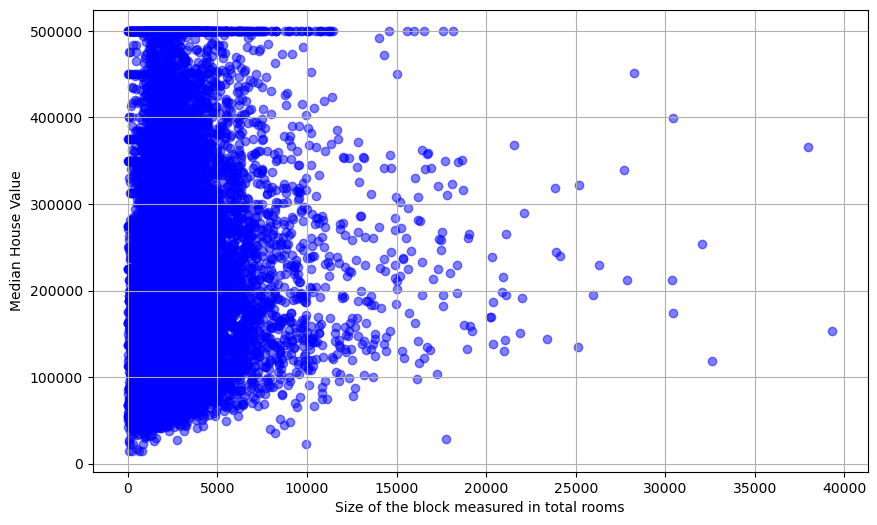

In [64]:
plt.figure(figsize=(10, 6))
plt.scatter(housing['total_rooms'], housing['median_house_value'], alpha=0.5, c='blue')
plt.xlabel('Size of the block measured in total rooms')
plt.ylabel('Median House Value')
plt.grid(True)
plt.show()

#### Scatterplot - Median House Value as a dependency on Median House Age

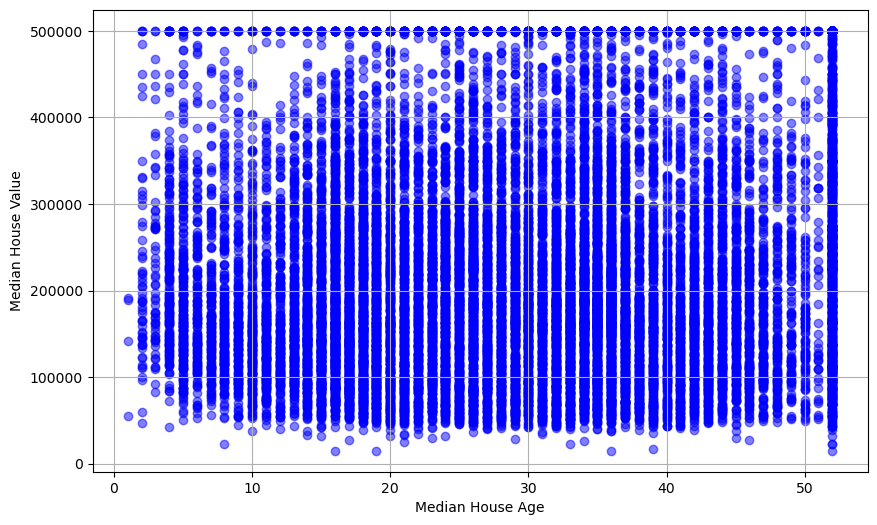

In [66]:
plt.figure(figsize=(10, 6))
plt.scatter(housing['housing_median_age'], housing['median_house_value'], alpha=0.5, c='blue')
plt.xlabel('Median House Age')
plt.ylabel('Median House Value')
plt.grid(True)
plt.show()

As seen in the two plots above, there isn’t much of a correlation between house value and either house size or house age. One might have expected a higher correlation, especially for house size. However, house size, as measured by total rooms, may not be the best metric.

We haven’t yet explored how location impacts house value. Let’s investigate that.

## Value of the houses compared to location

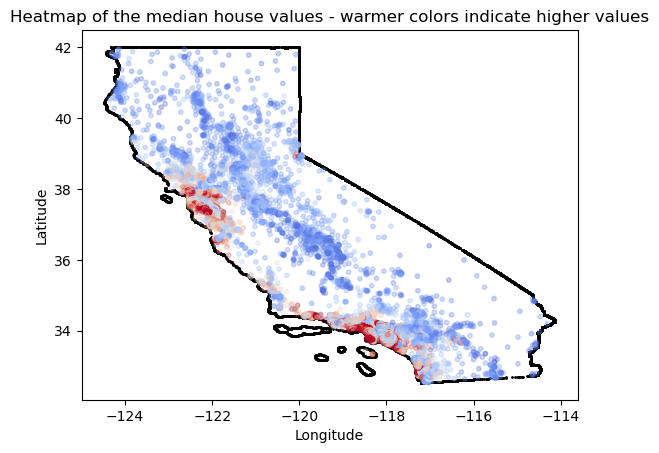

In [69]:
# Different colorschemes 'coolwarm', 'viridis', 'plasma', 'inferno', 'cividis'

housing['price_group'] = (housing['median_house_value'] // 5000).astype(int)    # Divided by 5000 to get them in 100 groups
colormap = plt.cm.coolwarm
gradient_values = np.linspace(0, 1, 101)
colors = colormap(gradient_values)
housing['price_color'] = housing['price_group'].apply(lambda idx: colors[idx])

fig, ax = plt.subplots()
ax.scatter(ca_border['xcoord'], ca_border['ycoord'], label='Border', color='black', s=1)
ax.scatter(housing['longitude'], housing['latitude'], label='Houses', color=housing['price_color'], s=10, alpha=0.3)
ax.set_title('Heatmap of the median house values - warmer colors indicate higher values')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
plt.show()

The map above displays all building blocks, with colors representing their values. Warmer colors indicate higher values. It is clear that two main areas with higher prices stand out: San Francisco and Los Angeles.

However, some building blocks share the exact same latitude and longitude coordinates. How does this affect the map? Continue reading for further investigation.

In [71]:
# Group by latitude and longitude to find out how many blocks share the exact same spot
duplicates = housing.groupby(['latitude', 'longitude']).size()

# Filter for pairs that occur more than once
duplicate_pairs = duplicates[duplicates > 1].sort_values(ascending=False)

duplicate_details = duplicate_pairs.reset_index(name='count')
print(duplicate_details)

unique_pairs_count = housing[['latitude', 'longitude']].drop_duplicates().shape[0]
print(f"Number of unique coordinate pairs: {unique_pairs_count}")

      latitude  longitude  count
0        37.80    -122.41     15
1        37.80    -122.42     11
2        37.78    -122.44     11
3        37.75    -122.41     10
4        37.80    -122.44     10
...        ...        ...    ...
4348     34.11    -118.18      2
4349     34.11    -118.17      2
4350     34.11    -118.16      2
4351     34.11    -118.14      2
4352     41.73    -122.64      2

[4353 rows x 3 columns]
Number of unique coordinate pairs: 12590


As we can see, there are 4 535 coordinate pairs that correspond to at least two building blocks, with the maximum overlap being 15 blocks at a single pair of coordinates. When plotting all coordinates, this overlap results in significant clustering. Out of the total data, there are 12 590 unique coordinate pairs.

Next, let’s group the data by coordinate pairs and analyze the maximum and minimum house values for each pair. Will this lead to a significant difference in the resulting heatmap? Let’s investigate.

#### Heatmaps when grouping by coordinate pairs

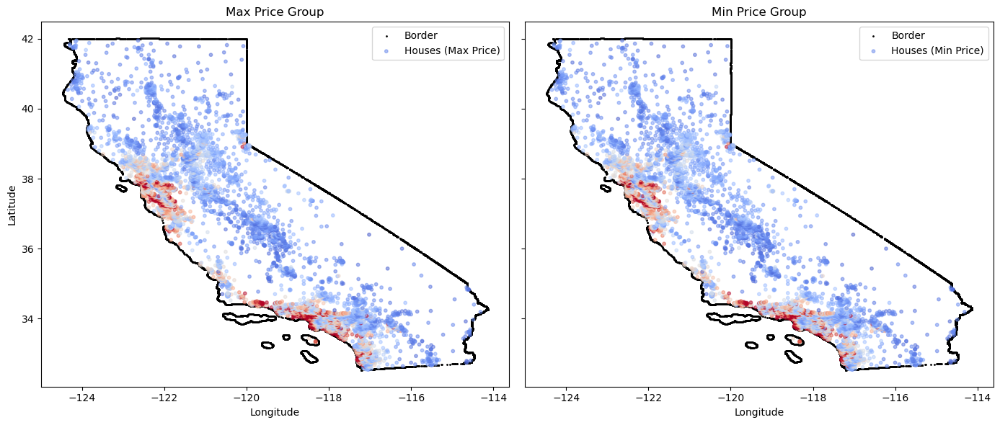

In [74]:
# Group data where bulding blocks have the same coordinates and choose the highest value within the group
housing_agg_max = housing.groupby(['latitude', 'longitude']).max('price_group').reset_index()
housing_agg_max['price_color'] = housing_agg_max['price_group'].apply(lambda idx: colors[idx])

# Group data where bulding blocks have the same coordinates and choose the lowest value within the group
housing_agg_min = housing.groupby(['latitude', 'longitude']).min('price_group').reset_index()
housing_agg_min['price_color'] = housing_agg_min['price_group'].apply(lambda idx: colors[idx])


fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharex=True, sharey=True)

# Plot max price_group on the left subplot
axes[0].scatter(ca_border['xcoord'], ca_border['ycoord'], label='Border', color='black', s=1)
scatter1 = axes[0].scatter(housing_agg_max['longitude'], housing_agg_max['latitude'], 
                           label='Houses (Max Price)', color=housing_agg_max['price_color'], s=10, alpha=0.5)
axes[0].set_title("Max Price Group")
axes[0].set_xlabel("Longitude")
axes[0].set_ylabel("Latitude")
axes[0].legend(loc='upper right')

# Plot min price_group on the right subplot
axes[1].scatter(ca_border['xcoord'], ca_border['ycoord'], label='Border', color='black', s=1)
scatter2 = axes[1].scatter(housing_agg_min['longitude'], housing_agg_min['latitude'], 
                           label='Houses (Min Price)', color=housing_agg_min['price_color'], s=10, alpha=0.5)
axes[1].set_title("Min Price Group")
axes[1].set_xlabel("Longitude")
axes[1].legend(loc='upper right')

plt.tight_layout()
plt.show()


The two plots above suggest that overlapping coordinate pairs do not need to be taken into consideration. Visually there is no significant difference between those plots. 

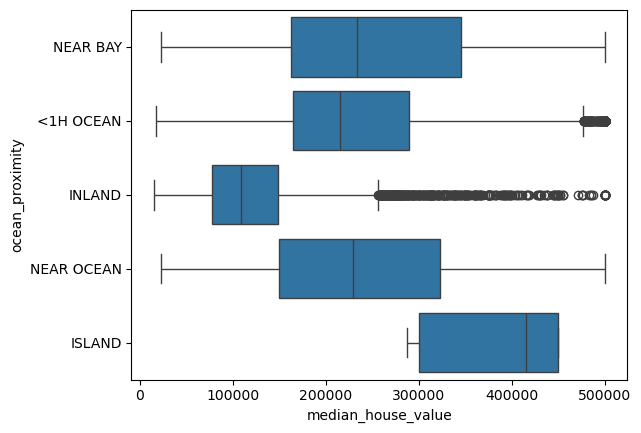

In [76]:
sns.boxplot(x='median_house_value', y='ocean_proximity', data=housing, )
plt.show()

The box plots above show the distribution of median house values categorized by ocean proximity. It is clear that houses located inland generally have lower values. However, this group also contains the most outliers, indicating that there are some houses in inland areas that stand out with significantly higher values compared to the rest.

Let’s further investigate how location affects house values.

#### Can we calculate the correlation between location and house value?

As seen in the heatmaps of house values, the most valuable houses appear to be concentrated in two major city areas — San Francisco and Los Angeles. I will calculate the distance from each building block to these two cities and then divide the housing dataset into two groups: one containing all building blocks closest to San Francisco and the other containing those closest to Los Angeles.

Next, I will calculate the correlation between house value and distance to each city, respectively.

In [80]:
# Define coordinates for the middle of the cities
sf_coords = (37.77, -122.42)  # San Francisco
la_coords = (34.05, -118.25)  # Los Angeles

# Calculate the distance using Haversine (a method that takes the curvature of the earth in to account)
distance = geodesic(sf_coords, la_coords).km
housing['distance_to_sf'] = housing.apply(lambda row: geodesic((row['latitude'], row['longitude']), sf_coords).km, axis=1)
housing['distance_to_la'] = housing.apply(lambda row: geodesic((row['latitude'], row['longitude']), la_coords).km, axis=1)

# Create subsets based on proximity
closer_to_sf = housing[housing['distance_to_sf'] < housing['distance_to_la']]
closer_to_la = housing[housing['distance_to_sf'] >= housing['distance_to_la']]

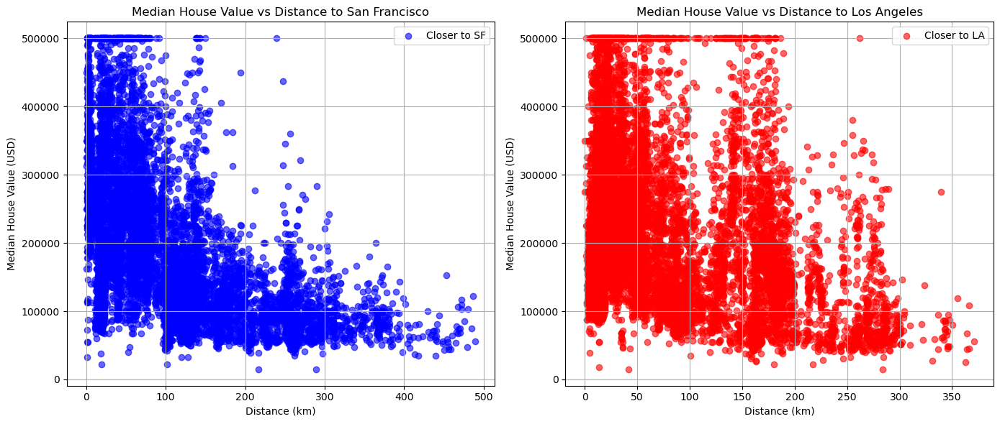

In [81]:

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot for houses closer to San Francisco
axes[0].scatter(closer_to_sf['distance_to_sf'], closer_to_sf['median_house_value'], 
                alpha=0.6, c='blue', label='Closer to SF')
axes[0].set_title('Median House Value vs Distance to San Francisco')
axes[0].set_xlabel('Distance (km)')
axes[0].set_ylabel('Median House Value (USD)')
axes[0].grid(True)
axes[0].legend()

# Plot for houses closer to Los Angeles
axes[1].scatter(closer_to_la['distance_to_la'], closer_to_la['median_house_value'], 
                alpha=0.6, c='red', label='Closer to LA')
axes[1].set_title('Median House Value vs Distance to Los Angeles')
axes[1].set_xlabel('Distance (km)')
axes[1].set_ylabel('Median House Value (USD)')
axes[1].grid(True)
axes[1].legend()

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

According to the plots above, house values near the cities vary widely, but farther from the cities, the number of high-value houses decreases. This trend is more evident in the case of San Francisco.

Let’s calculate the correlations.

In [83]:
corr_dist_sf = closer_to_sf[['median_house_value', 'distance_to_sf']].corr()['median_house_value']
corr_dist_la = closer_to_la[['median_house_value', 'distance_to_la']].corr()['median_house_value']

print(corr_dist_sf)
print(corr_dist_la)

median_house_value    1.000000
distance_to_sf       -0.564757
Name: median_house_value, dtype: float64
median_house_value    1.000000
distance_to_la       -0.314249
Name: median_house_value, dtype: float64


distance_to_sf = -0.5648: This is a moderate to strong negative correlation, suggesting that distance from San Francisco has a meaningful impact on house value. In other words, the farther a house is from San Francisco, the lower its median value, and this relationship is fairly strong.

distance_to_la = -0.3142: This is a weak to moderate negative correlation, indicating that distance from Los Angeles has less of an impact on house value compared to San Francisco. This could be due to a more distributed housing market around Los Angeles or the presence of other significant areas affecting house prices.

This method has a weakness because it divides the building blocks into two separate datasets, treating them as if there is no interaction between the two groups. However, what about the houses situated between the two cities? These houses may be influenced by both cities, but this approach does not account for that possibility.

#### Combinded distance to both cities

Next we add the distance to each city and calculate the correlation. This is a weak correlation as seen below. 

In [87]:
housing['distance_combined'] = housing['distance_to_sf'] + housing['distance_to_la']
corr_dist_combined = housing[['median_house_value', 'distance_combined']].corr()['median_house_value']
print(corr_dist_combined)

median_house_value    1.000000
distance_combined    -0.292317
Name: median_house_value, dtype: float64


#### Shortest distance to either city

We can achieve a slightly better correlation by using the shortest distance to either San Francisco or Los Angeles. However, it is still quite weak.

median_house_value    1.000000
min_dist_city        -0.434785
Name: median_house_value, dtype: float64


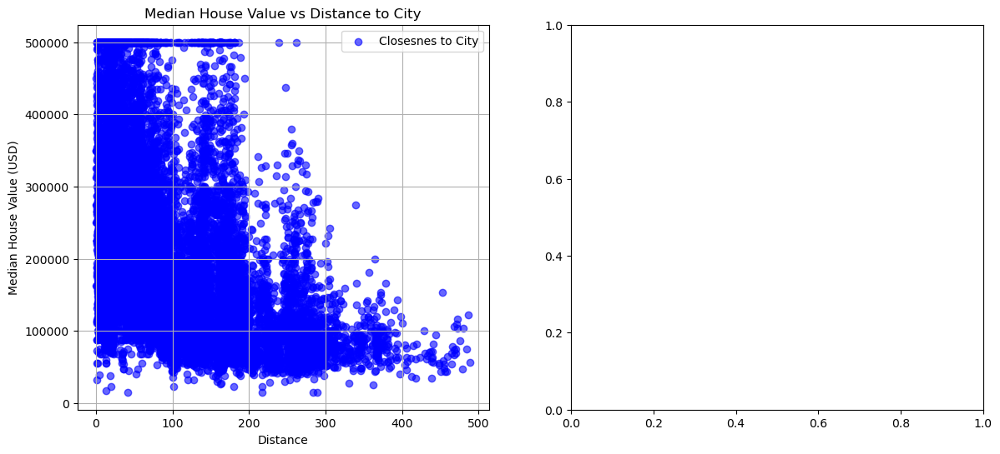

In [90]:
housing['min_dist_city'] = housing[['distance_to_sf', 'distance_to_la']].min(axis=1)

corr_min_dist= housing[['median_house_value', 'min_dist_city']].corr()['median_house_value']
print(corr_min_dist)


fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot for houses closer to San Francisco
axes[0].scatter(housing['min_dist_city'], housing['median_house_value'], 
                alpha=0.6, c='blue', label='Closesnes to City')
axes[0].set_title('Median House Value vs Distance to City')
axes[0].set_xlabel('Distance')
axes[0].set_ylabel('Median House Value (USD)')
axes[0].grid(True)
axes[0].legend()

#### Correlation between distance to the ocean and house value

Calculating the distance to the ocean for each building block is a bit more challenging. I have a dataset containing numerous coordinates along California's coastal border. Initially, I attempted to determine the closest point on the border for each building block and then calculated the distance using the Haversine formula, as done previously for the city distances. However, this approach was too time-consuming for my computer.

To address this, I switched to a simpler method where I treated California as a flat surface and calculated all distances using the Euclidean metric, ignoring the conversion to kilometers.

The results are shown below. The correlation of -0.487964 is slightly better than before, but it remains relatively weak.

In [93]:
# I created a CSV file containing the coordinates of California's coastal border using QGIS.
ca_coast = pd.read_csv('ca_coast_coordinates.csv', sep=';')

In [97]:
coast_coords = np.array(ca_coast[['ycoord', 'xcoord']])
housing_coords = np.array(housing[['latitude', 'longitude']])

# Function to calculate the distance from each house to the nearest coastline point
# Calculate euclidian distance with cdist() from Scipy so the distance is not in km. 
# I couldn't use the Haversine formula (geodesic from Geopy) because it took too long time to calculate on my computer
def closest_coastline_distance(housing_coords, coast_coords):
    distances = []
    for house_coord in housing_coords:
        dist = distance.cdist([house_coord], coast_coords, 'euclidean') 
        distances.append(np.min(dist))
    return distances

# Calculate distances and add them to the housing DataFrame
housing['distance_to_coast'] = closest_coastline_distance(housing_coords, coast_coords)


In [99]:
corr_dist_coast = housing[['median_house_value', 'distance_to_coast']].corr()['median_house_value']

print(corr_dist_coast)

median_house_value    1.000000
distance_to_coast    -0.487964
Name: median_house_value, dtype: float64


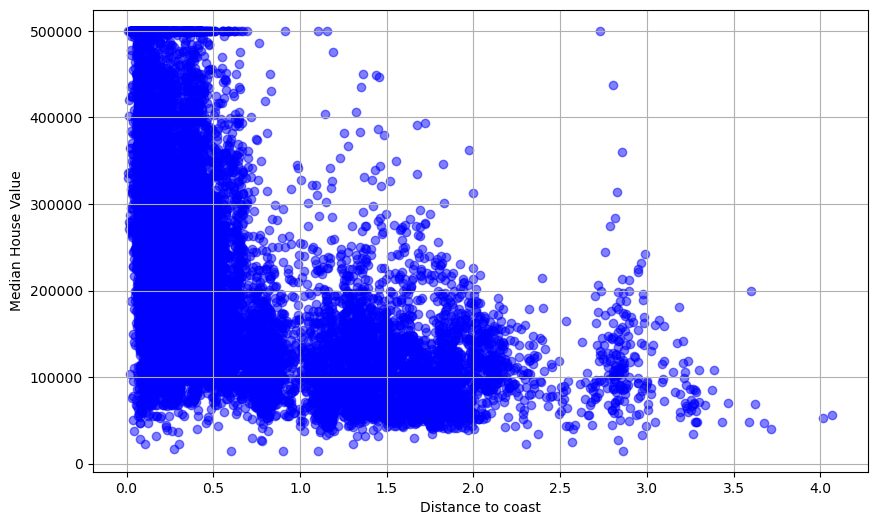

In [101]:
plt.figure(figsize=(10, 6))
plt.scatter(housing['distance_to_coast'], housing['median_house_value'], alpha=0.5, c='blue')
#plt.title('Scatter Plot: Distance to Coast vs. Median House Value')
plt.xlabel('Distance to coast')
plt.ylabel('Median House Value')
plt.grid(True)
plt.show()

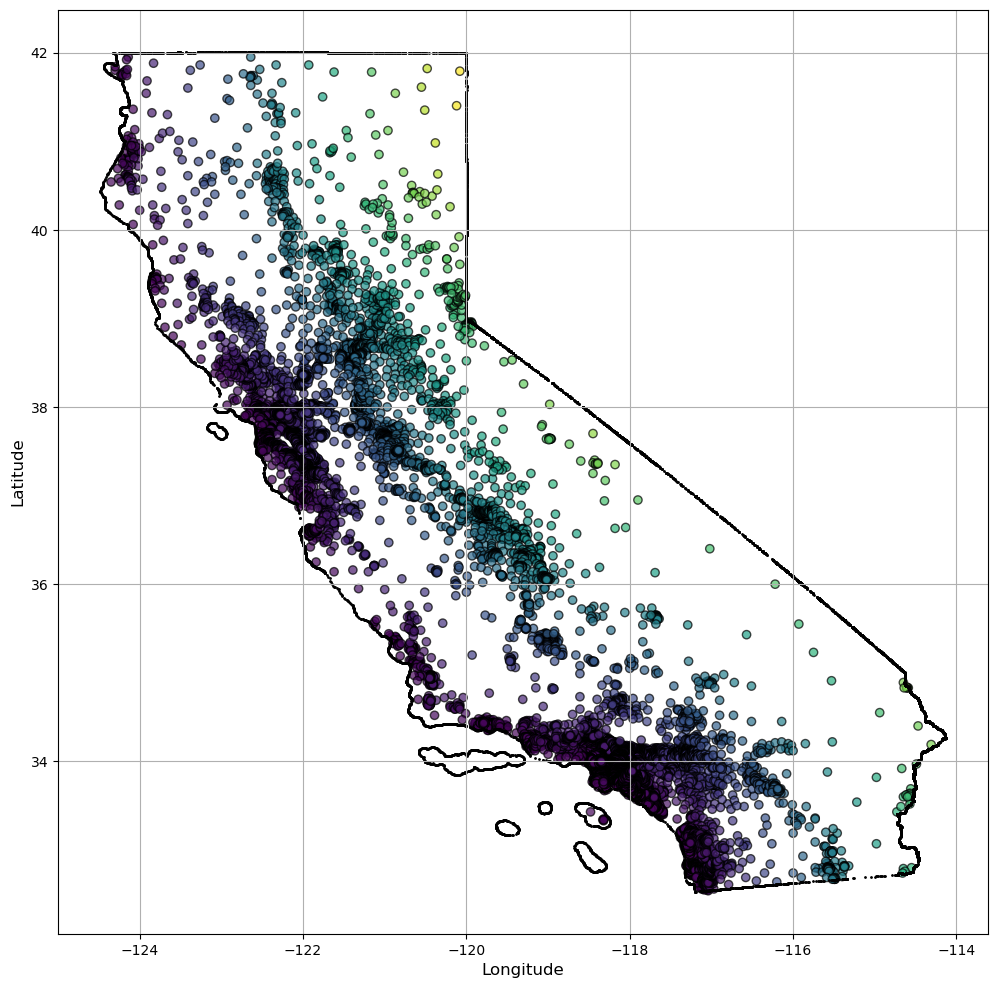

In [103]:
plt.figure(figsize=(12, 12))

plt.scatter(housing['longitude'], housing['latitude'], c=housing['distance_to_coast'], cmap='viridis', alpha=0.7, edgecolors='k')
plt.scatter(ca_border['xcoord'], ca_border['ycoord'], label='Border', color='black', s=1)

plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)
plt.grid(True)

plt.show()

I made a quick plot to verify that my distance-to-ocean calculations were correct.

## Summary

The dataset contains some null values, but they make up only about 1% of the rows, so they can be dropped without much impact. However, the null values are found only in the "bedrooms" column, which is not critical for most analyses, so you can choose to keep them if they are not relevant to your specific analysis.

There are some strange values where the numbers don't align, such as households with fewer than one person or an unusually high number of people, or households with fewer than one room. Depending on the analysis, these values might be worth removing.

My main concern with the dataset is the capping of house values. There are too many capped values, and the cap is too low. It would be better to use the original data and consider dropping extreme outliers if they significantly affect the analysis. Speaking of outliers, there are many in some columns, but this is expected in real-world datasets like this one, especially for columns like "total_rooms" and "population," where extreme values (e.g., large apartment complexes or densely populated areas) are common. The most extreme outliers could be errors and might need to be dropped, but they are relatively few.

When analyzing correlations, it's clear that the strongest correlation is between house value and income. However, location is still important. High-value houses are mostly located near urban areas like San Francisco and Los Angeles, though these cities also contain low-value houses, showing a broad spectrum. In inland areas, high-value houses are scarce, and the value range is narrower. Proximity to the ocean affects house prices, but this is mainly due to cities being located along the coastline.

I also experimented with plotting building blocks using Folium in OpenStreetMap. Zooming in closely reveals that house values in cities are highly fragmented. It would be interesting to have more detailed data, such as one data point per building in cities, to better understand how neighborhoods influence house values. Additionally, having more socio-economic data, like school quality, crime rates, etc., would provide further insights, as we currently only have income data.

The dataset is from 1990, and California's population has since increased by 10 million people, with incomes changing as well. Therefore, I wouldn’t recommend using this dataset in a model today if the goal is to predict the current housing market in California. More recent data would be preferable. It would also be valuable to have data from different years to observe changes over time. Are high-value areas still the same? Have environmental factors influenced house values? Will people become more conscious of living near the ocean?

Another issue is that the "building blocks" in the dataset are not clearly defined. Sometimes a data point represents a single house, while other times it includes several buildings. It seems the data originates from a larger geographic area, encompassing all residents there. This could affect any analysis of house or building values. This becomes evident when zooming in on OpenStreetMap, where the data points resemble a lattice pattern in large cities.



In [105]:
import folium
import matplotlib.cm as cm
import matplotlib.colors as colors

map_center = [37.5, -119.5]  
m = folium.Map(location=map_center, zoom_start=6)

colormap = plt.colormaps['YlOrRd'] 
norm = colors.Normalize(vmin=housing['median_house_value'].min(), vmax=housing['median_house_value'].max())

for _, row in housing.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=None,
        fill=True,
        fill_color=colors.rgb2hex(colormap(norm(row['median_house_value']))),
        fill_opacity=0.6
    ).add_to(m)

m